In [2]:
library(tidyverse)
library(miloR)
library(SingleCellExperiment)
library(scater)
library(scran)
library(dplyr)
library(patchwork)
library(ggplot2)
library(Seurat)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.4 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.2      ✔ forcats 0.5.2 
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Loading required package: edgeR

Loading required package: limma

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMax

In [3]:
source('milo.R')
source('milo_plotting.R')

In [117]:
obj = qs::qread('_targets/objects/exp_labelled_other')

In [118]:
obj = subset(obj, subset = labels == 'MOL')
obj = subset(obj, subset = strain == 'obob')
obj = subset(obj, subset = time == 'Day5')
obj

An object of class Seurat 
56583 features across 1184 samples within 3 assays 
Active assay: SCT (24262 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

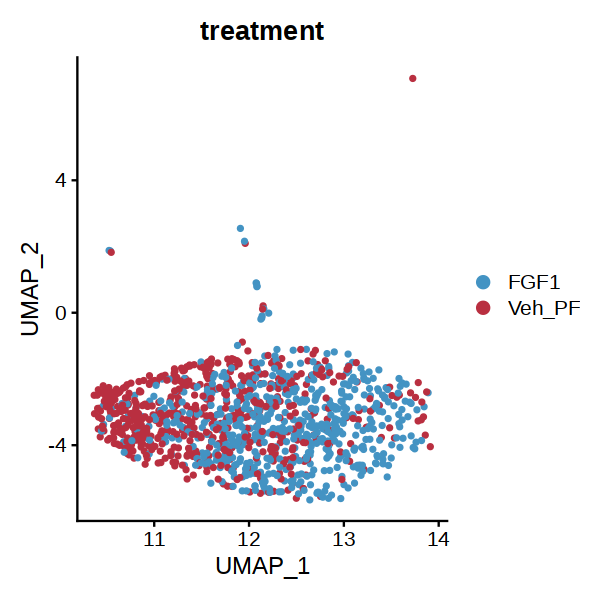

In [95]:
options(repr.plot.width=5, repr.plot.height=5)
p2 = DimPlot(obj, group.by = "treatment", cols=c("#4393c3", "#b92f40"))
p2

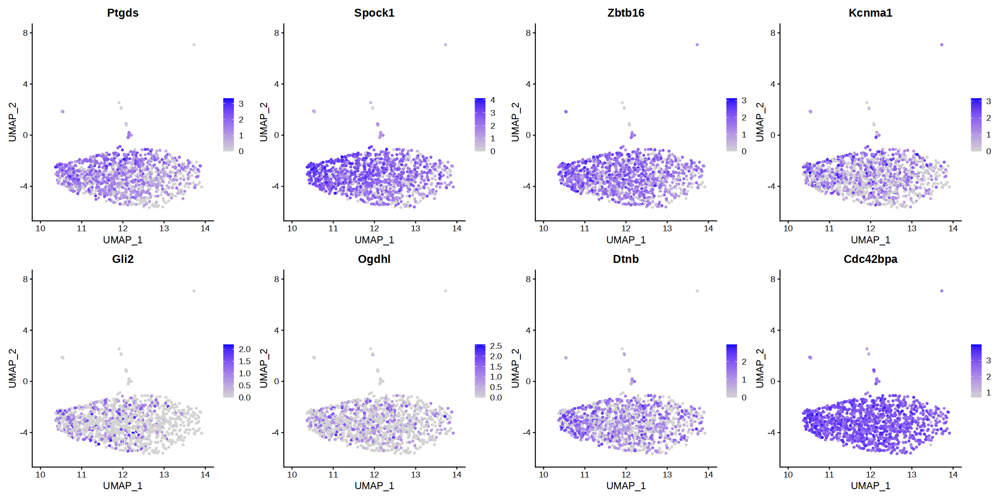

In [137]:
top_degs = c("Ptgds", "Spock1", "Zbtb16", "Kcnma1", "Gli2", "Ogdhl", "Dtnb", "Cdc42bpa")
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(obj, top_degs, ncol = 4)

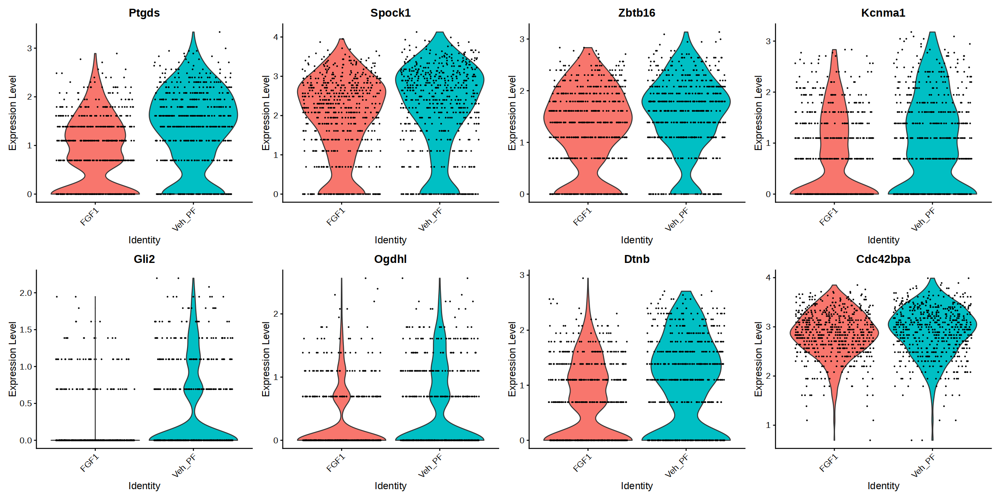

In [138]:
options(repr.plot.width=20, repr.plot.height=10)
VlnPlot(object = obj, features = top_degs, group.by = 'treatment', ncol = 4)

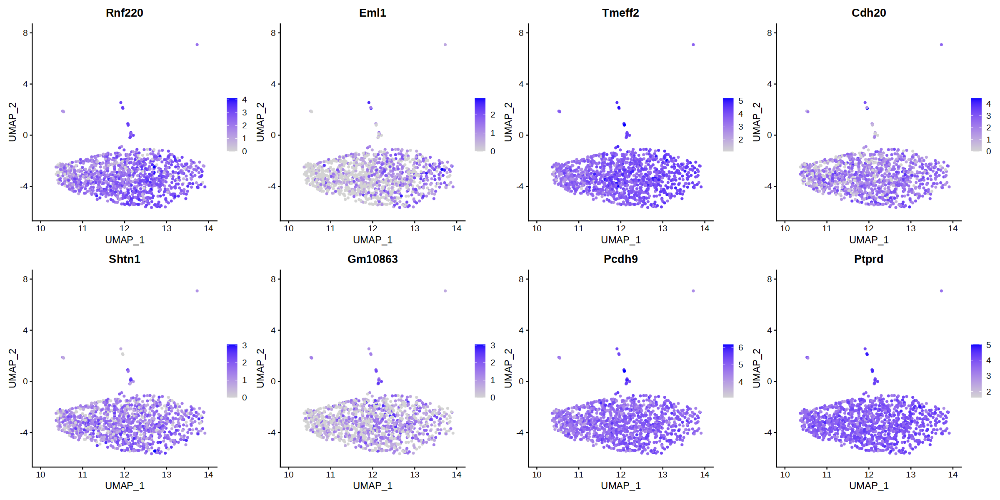

In [132]:
top_degs = c("Rnf220", "Eml1", "Tmeff2", "Cdh20", "Shtn1", "Gm10863", "Pcdh9", "Ptprd")
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(obj, top_degs, ncol = 4)

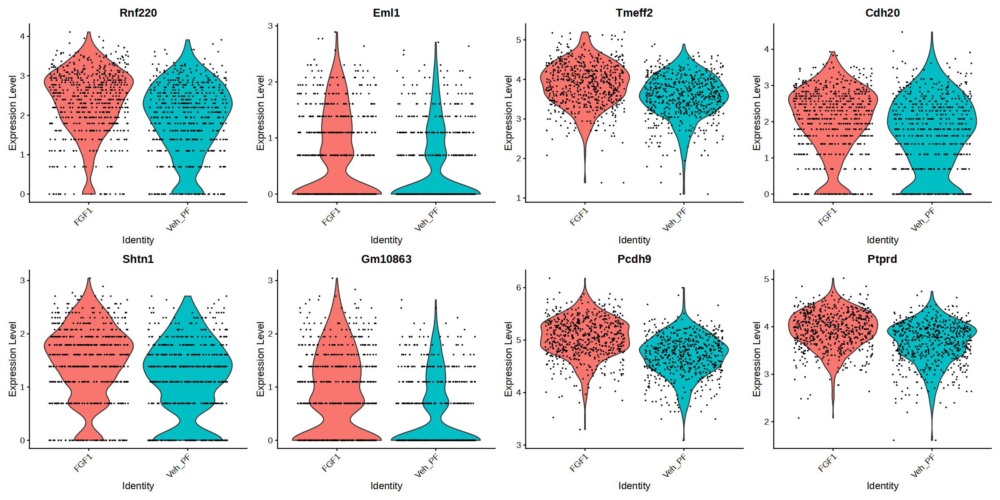

In [133]:
options(repr.plot.width=20, repr.plot.height=10)
VlnPlot(object = obj, features = top_degs, group.by = 'treatment', ncol = 4)

In [96]:
milo = obj %>% prep_obj_for_milo %>% convert_obj_to_sce %>% make_milo
milo

Constructing kNN graph with k:40

Checking valid object

Running refined sampling with reduced_dim

Checking meta.data validity

Counting cells in neighbourhoods



class: Milo 
dim: 24262 1184 
metadata(0):
assays(2): counts logcounts
rownames(24262): Lypla1 Tcea1 ... Olfr187 ENSMUSG00000100896
rowData names(0):
colnames(1184): GCCAACGGTTGTTTGG_1_1 GCATGATTCTTCACAT_1_1 ...
  GATCACACATTGACAC_5_3 CGTTAGACATTCTTCA_5_3
colData names(36): orig.ident nCount_RNA ... group ident
reducedDimNames(2): PCA UMAP
mainExpName: SCT
altExpNames(0):
nhoods dimensions(2): 1184 97
nhoodCounts dimensions(2): 97 14
nhoodDistances dimension(1): 97
graph names(1): graph
nhoodIndex names(1): 97
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 97 97

In [97]:
milo@colData$group = milo@colData$group %>% as.character
milo@colData$batch = milo@colData$batch %>% as.character
milo@colData$strain = milo@colData$strain %>% as.character

In [98]:
make_design_df = function(milo_obj){
    design_df <- data.frame(SingleCellExperiment::colData(milo_obj))[, c('hash.mcl.ID', 'group', 'batch', "strain")]
    #convert seq-pool to factor
    design_df$batch <- design_df$batch
    #keep unique rows
    design_df <- dplyr::distinct(design_df)
    #change rownames
    rownames(design_df) <- design_df$hash.mcl.ID
    design_df
}

In [99]:
design_df = make_design_df(milo)
design_df

,hash.mcl.ID,group,batch,strain
,<chr>,<chr>,<chr>,<chr>
N8,N8,Veh_PF.Day5.obob,Batch__1,obob
N7,N7,FGF1.Day5.obob,Batch__1,obob
M8,M8,Veh_PF.Day5.obob,Batch__1,obob
M9,M9,FGF1.Day5.obob,Batch__1,obob
N17,N17,FGF1.Day5.obob,Batch__2,obob
N12,N12,Veh_PF.Day5.obob,Batch__2,obob
M10,M10,FGF1.Day5.obob,Batch__2,obob
M11,M11,Veh_PF.Day5.obob,Batch__2,obob
N26,N26,FGF1.Day5.obob,Batch__3,obob


In [100]:
mm = make_model_matrix(design_df)
mm

,groupFGF1.Day5.obob,groupVeh_PF.Day5.obob,batchBatch__2,batchBatch__3
N8,0,1,0,0
N7,1,0,0,0
M8,0,1,0,0
M9,1,0,0,0
N17,1,0,1,0
N12,0,1,1,0
M10,1,0,1,0
M11,0,1,1,0
N26,1,0,0,1
M14,0,1,0,1


In [101]:
contrast = "groupFGF1.Day5.obob-groupVeh_PF.Day5.obob"

In [102]:
mod.constrast <- makeContrasts(contrasts=contrast, levels=mm)
mod.constrast

,groupFGF1.Day5.obob-groupVeh_PF.Day5.obob
groupFGF1.Day5.obob,1
groupVeh_PF.Day5.obob,-1
batchBatch__2,0
batchBatch__3,0


In [103]:


da_results = get_da_results(milo_obj=milo,
                            model_matrix=mm, design_df=design_df, model_contrasts_str=contrast)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



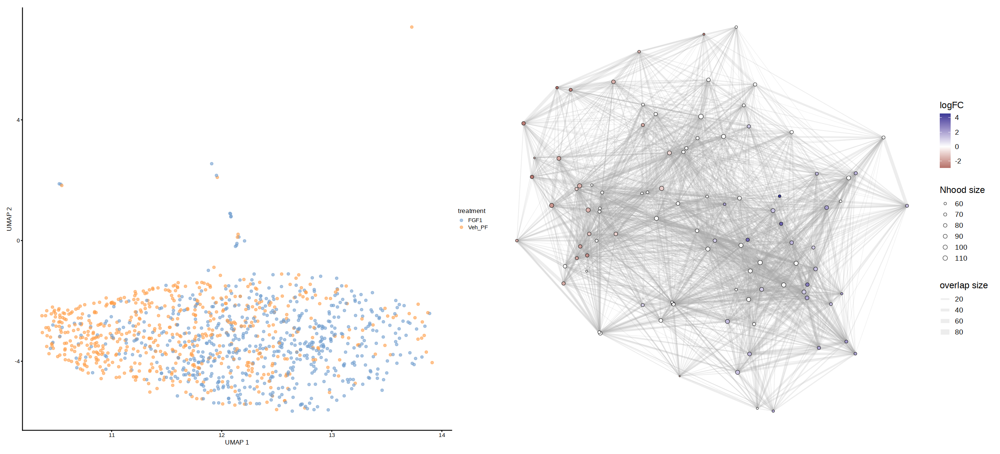

In [104]:
options(repr.plot.width=22, repr.plot.height=10)


plotUMAP(milo, colour_by="treatment") + plotNhoodGraphDA(milo, da_results, alpha=0.1) +
  plot_layout(guides="auto" )

In [139]:
obj = qs::qread('_targets/objects/exp_labelled_other') %>%
subset(subset = labels == 'MOL')

obj

An object of class Seurat 
56583 features across 4023 samples within 3 assays 
Active assay: SCT (24262 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

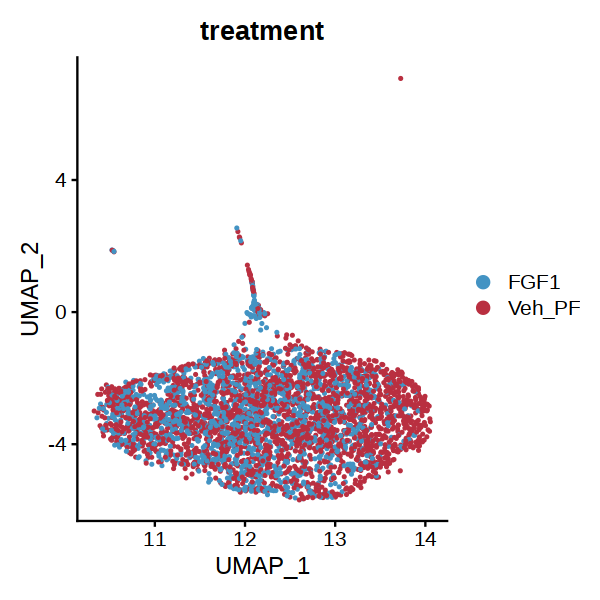

In [140]:
options(repr.plot.width=5, repr.plot.height=5)
p2 = DimPlot(obj, group.by = "treatment", cols=c("#4393c3", "#b92f40"))
p2

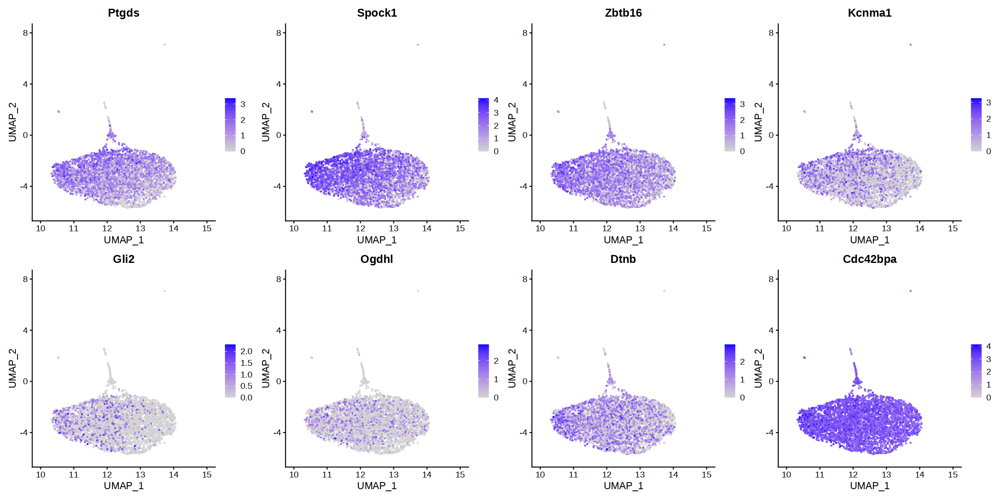

In [141]:
top_degs = c("Ptgds", "Spock1", "Zbtb16", "Kcnma1", "Gli2", "Ogdhl", "Dtnb", "Cdc42bpa")
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(obj, top_degs, ncol = 4)

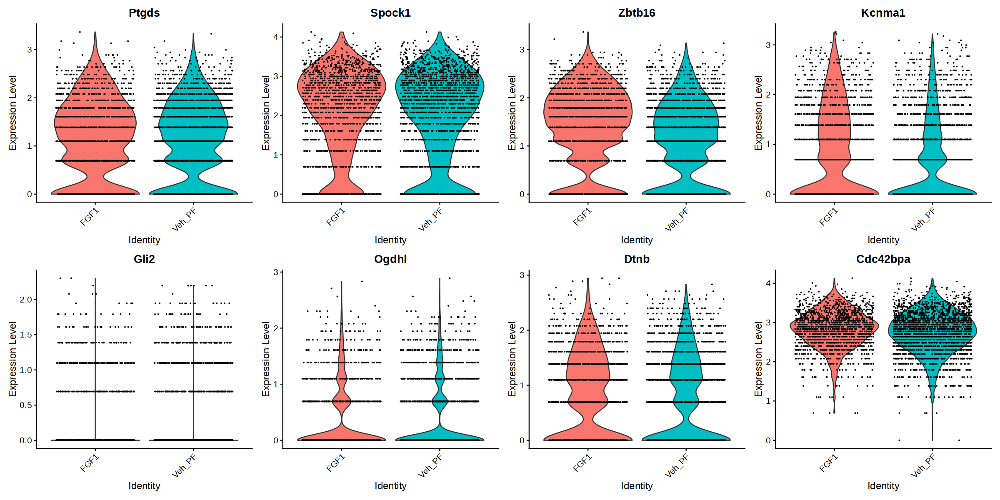

In [142]:
options(repr.plot.width=20, repr.plot.height=10)
VlnPlot(object = obj, features = top_degs, group.by = 'treatment', ncol = 4)

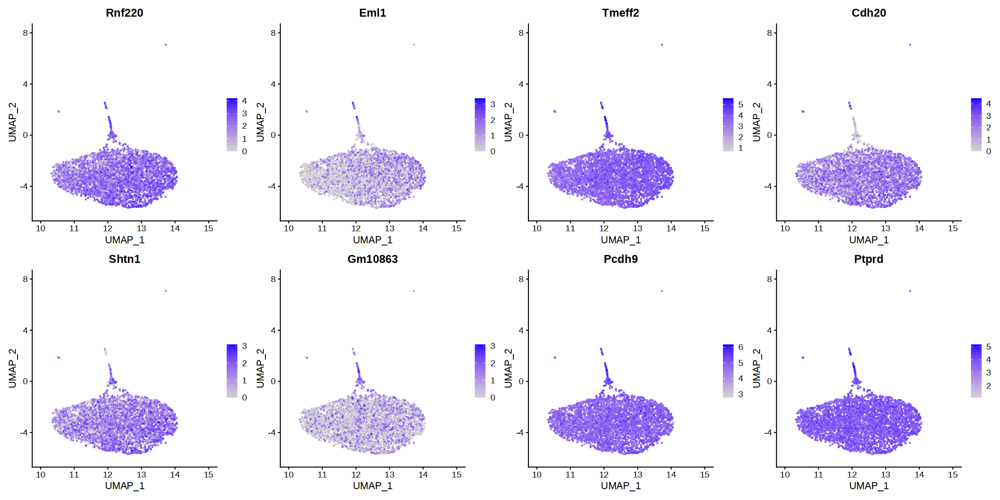

In [143]:
top_degs = c("Rnf220", "Eml1", "Tmeff2", "Cdh20", "Shtn1", "Gm10863", "Pcdh9", "Ptprd")
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(obj, top_degs, ncol = 4)

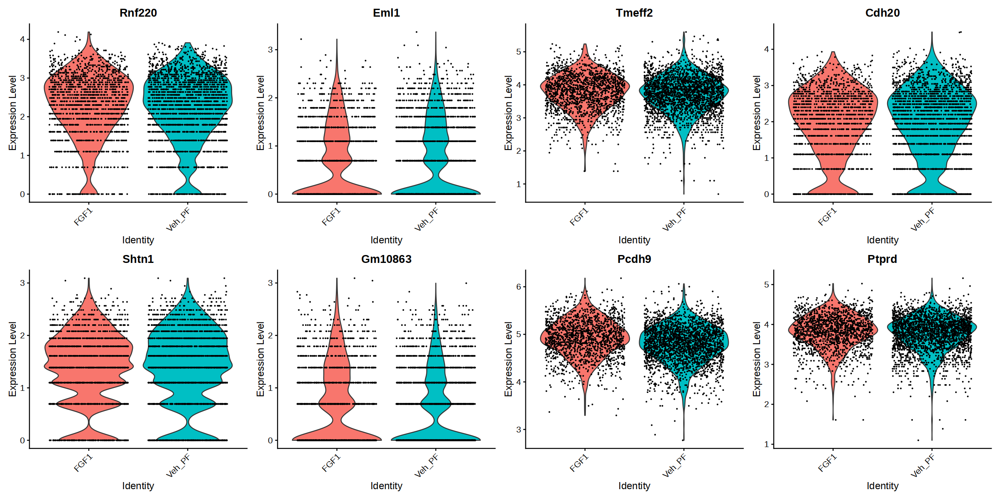

In [144]:
options(repr.plot.width=20, repr.plot.height=10)
VlnPlot(object = obj, features = top_degs, group.by = 'treatment', ncol = 4)

In [145]:
milo = obj %>% prep_obj_for_milo %>% convert_obj_to_sce %>% make_milo
milo

Constructing kNN graph with k:40

Checking valid object

Running refined sampling with reduced_dim

Checking meta.data validity

Counting cells in neighbourhoods



class: Milo 
dim: 24262 4023 
metadata(0):
assays(2): counts logcounts
rownames(24262): Lypla1 Tcea1 ... Olfr187 ENSMUSG00000100896
rowData names(0):
colnames(4023): ATTACTCTCCGCGGAT_1_1 AGTTCGAAGAAACCAT_1_1 ...
  AGGCATTGTCATCGGC_5_3 TGTAGACCAATGAAAC_5_3
colData names(36): orig.ident nCount_RNA ... group ident
reducedDimNames(2): PCA UMAP
mainExpName: SCT
altExpNames(0):
nhoods dimensions(2): 4023 320
nhoodCounts dimensions(2): 320 36
nhoodDistances dimension(1): 320
graph names(1): graph
nhoodIndex names(1): 320
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 320 320

In [146]:
milo@colData$group = milo@colData$group %>% as.character
milo@colData$batch = milo@colData$batch %>% as.character
milo@colData$strain = milo@colData$strain %>% as.character

In [147]:
make_design_df = function(milo_obj){
    design_df <- data.frame(SingleCellExperiment::colData(milo_obj))[, c('hash.mcl.ID', 'group', 'batch', "strain")]
    #convert seq-pool to factor
    design_df$batch <- design_df$batch
    #keep unique rows
    design_df <- dplyr::distinct(design_df)
    #change rownames
    rownames(design_df) <- design_df$hash.mcl.ID
    design_df
}

In [148]:
design_df = make_design_df(milo)
design_df

,hash.mcl.ID,group,batch,strain
,<chr>,<chr>,<chr>,<chr>
J11,J11,FGF1.Day14.obob,Batch__1,obob
M4,M4,Veh_PF.Day5.BL6,Batch__1,BL6
N8,N8,Veh_PF.Day5.obob,Batch__1,obob
M24,M24,Veh_PF.Day14.obob,Batch__1,obob
M2,M2,Veh_PF.Day5.BL6,Batch__1,BL6
M18,M18,Veh_PF.Day14.BL6,Batch__1,BL6
N7,N7,FGF1.Day5.obob,Batch__1,obob
J2,J2,Veh_PF.Day14.obob,Batch__1,obob
M8,M8,Veh_PF.Day5.obob,Batch__1,obob


In [149]:
mm = make_model_matrix(design_df)
mm

,groupFGF1.Day14.obob,groupFGF1.Day5.obob,groupVeh_PF.Day14.BL6,groupVeh_PF.Day14.obob,groupVeh_PF.Day5.BL6,groupVeh_PF.Day5.obob,batchBatch__2,batchBatch__3
J11,1,0,0,0,0,0,0,0
M4,0,0,0,0,1,0,0,0
N8,0,0,0,0,0,1,0,0
M24,0,0,0,1,0,0,0,0
M2,0,0,0,0,1,0,0,0
M18,0,0,1,0,0,0,0,0
N7,0,1,0,0,0,0,0,0
J2,0,0,0,1,0,0,0,0
M8,0,0,0,0,0,1,0,0
M17,0,0,1,0,0,0,0,0


In [150]:
contrast = "groupFGF1.Day5.obob-groupVeh_PF.Day5.obob"

In [151]:
mod.constrast <- makeContrasts(contrasts=contrast, levels=mm)
mod.constrast

,groupFGF1.Day5.obob-groupVeh_PF.Day5.obob
groupFGF1.Day14.obob,0
groupFGF1.Day5.obob,1
groupVeh_PF.Day14.BL6,0
groupVeh_PF.Day14.obob,0
groupVeh_PF.Day5.BL6,0
groupVeh_PF.Day5.obob,-1
batchBatch__2,0
batchBatch__3,0


In [152]:


da_results = get_da_results(milo_obj=milo,
                            model_matrix=mm, design_df=design_df, model_contrasts_str=contrast)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



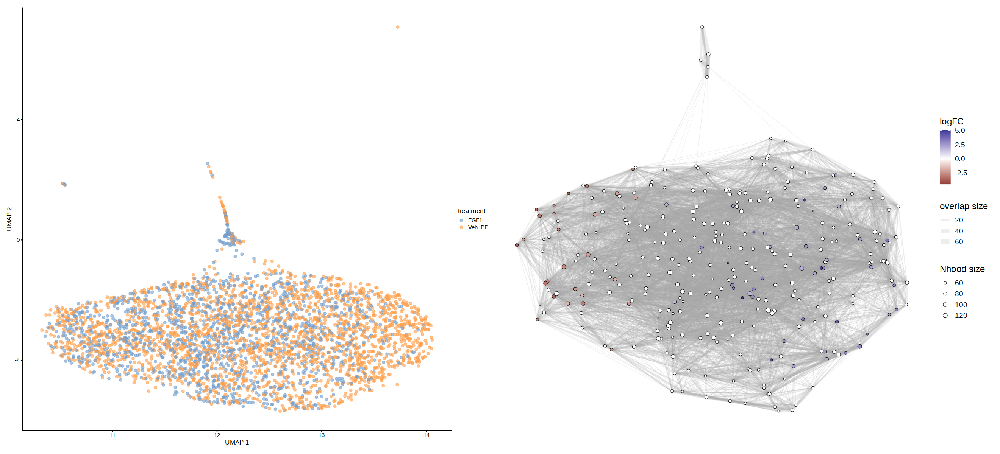

In [153]:
options(repr.plot.width=22, repr.plot.height=10)


plotUMAP(milo, colour_by="treatment") + plotNhoodGraphDA(milo, da_results, alpha=0.1) +
  plot_layout(guides="auto" )

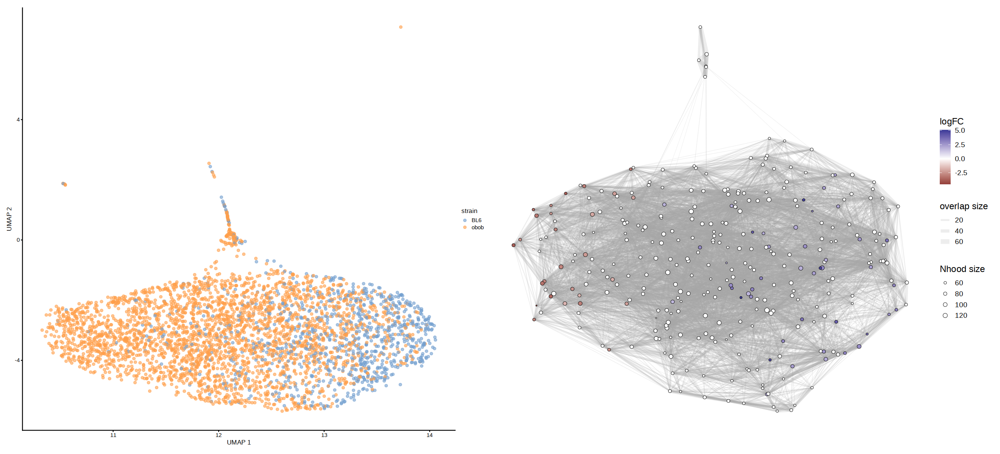

In [154]:
options(repr.plot.width=22, repr.plot.height=10)


plotUMAP(milo, colour_by="strain") + plotNhoodGraphDA(milo, da_results, alpha=0.1) +
  plot_layout(guides="auto" )